# Various Sequence to Sequence Architectures

## Basic Models

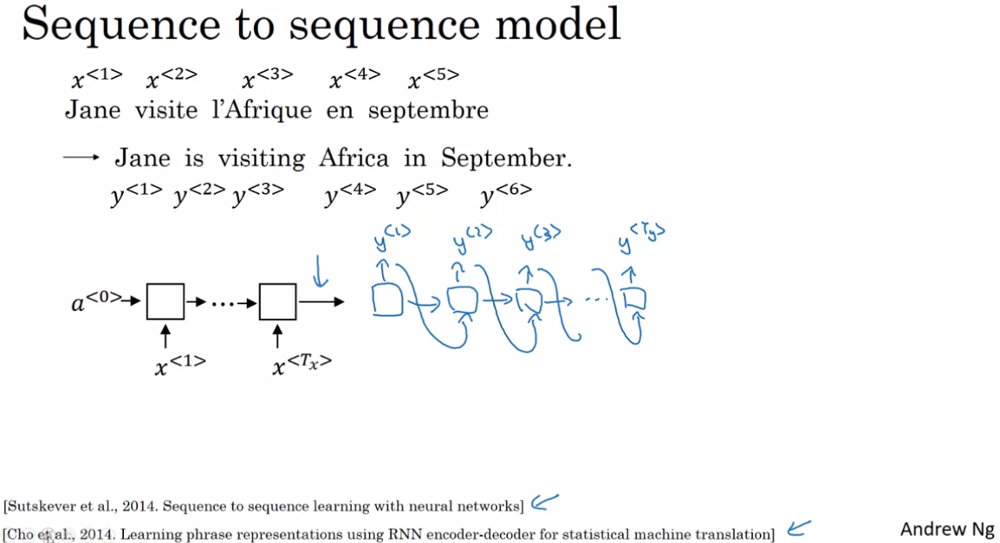

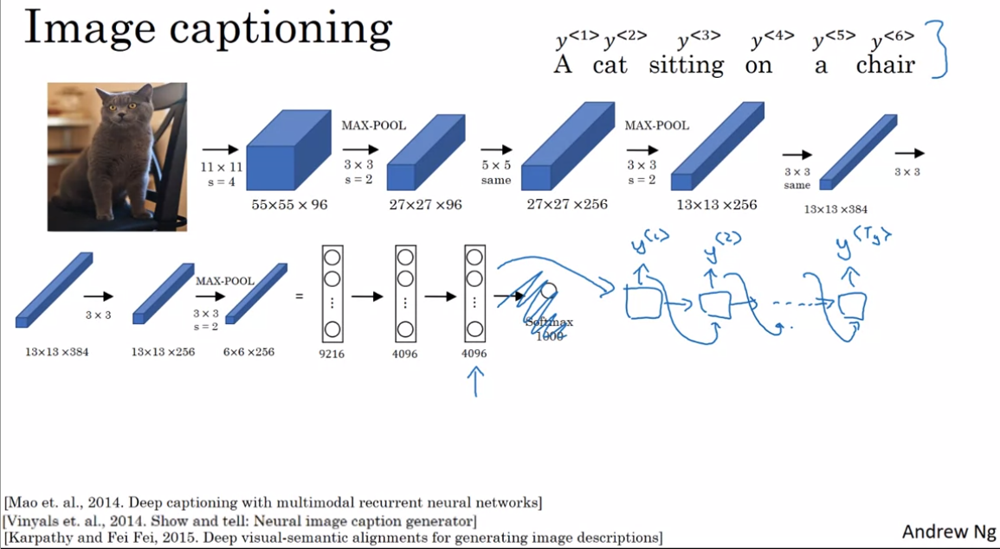

## Picking the Most Likely Sentence

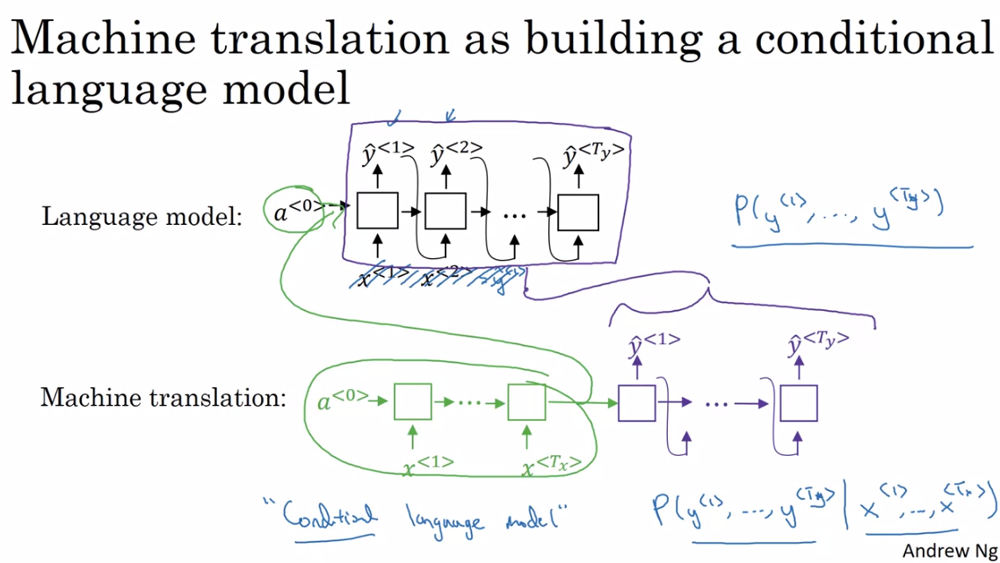

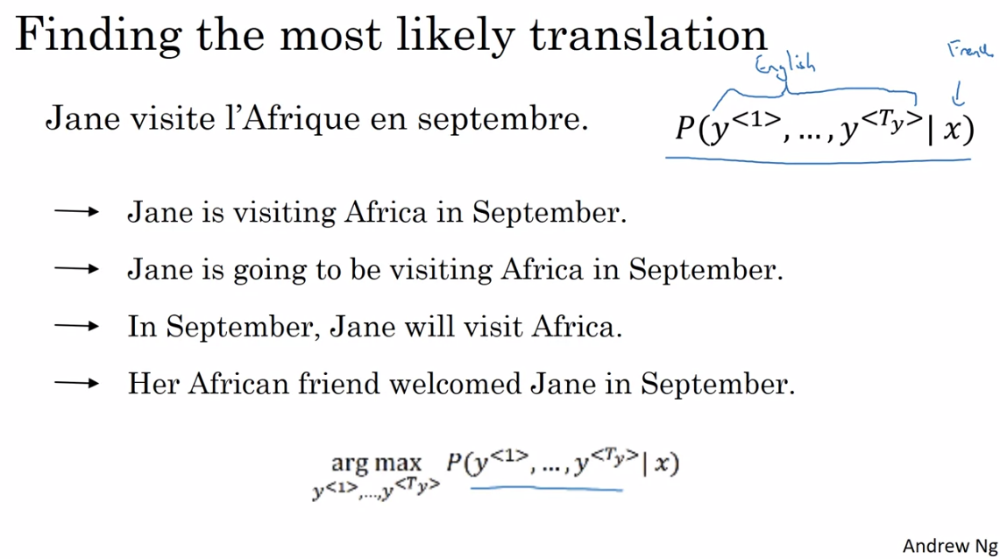

- Why Not a Greedy Search?
    - Greedy search refers to the process where we pick the word that maximizes $P(\hat y^{i} | x)$ one by one.
    - However, greedy search might return words that don't be the best collectively as one sentence.

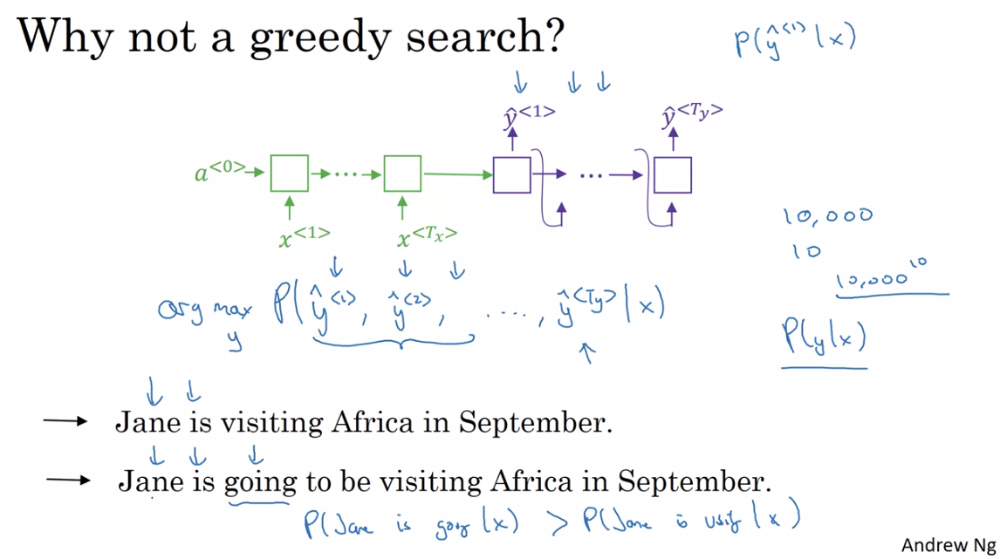

## Beam Search
- Step 1
    - In the Beam Search algorithm, we define a parameter of **beam width** $B$.
    - Then we feed our input sentence into the encoder and then decoder, which then generate a softmax output.
    - However, the model will keep tracking all $B$ words with the highest probability for the first output word.
        - In the example below, we have $B=3$, and the model keep tracking three words "in", "jane", and "september" for the first output word.

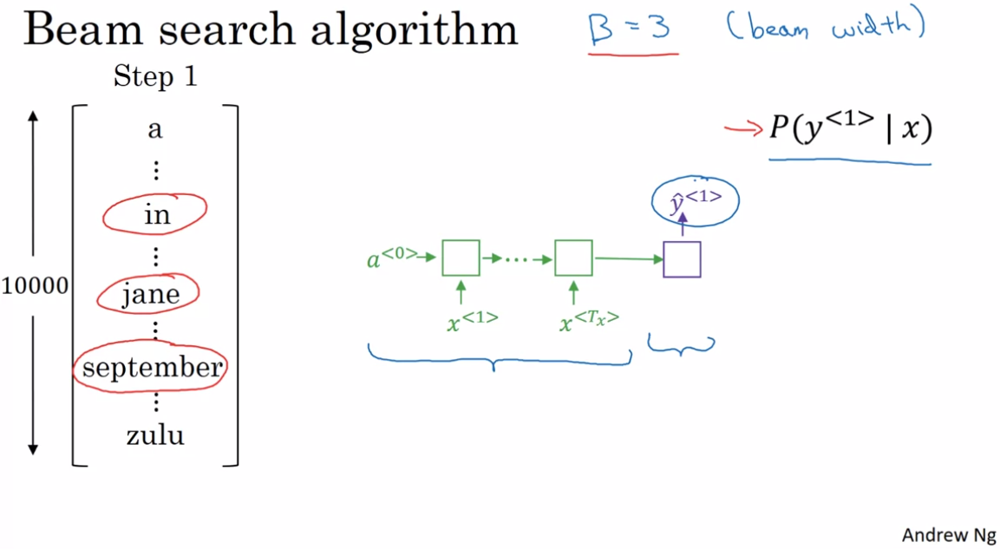

- Step 2
    - For each of the words we track from the step 1, we feed it into step 2 as input, along with the original input sentence, in order to find the best combination of the first and second output words.
    - After evaluating the probability of all these $B \times N_{vocabulary}$ combinations, we again only keep the top $B$ combinations.
        - In the example below, we evaluate the combination with all 10000 vocabularies for "in", "jane", and "september", but finally only keep the top 3 combinations, e.g. "in September", "jane is", and "jane visits".
        - Note that in this case "september" is then automatically rejected from being the first output word after step 2.
    
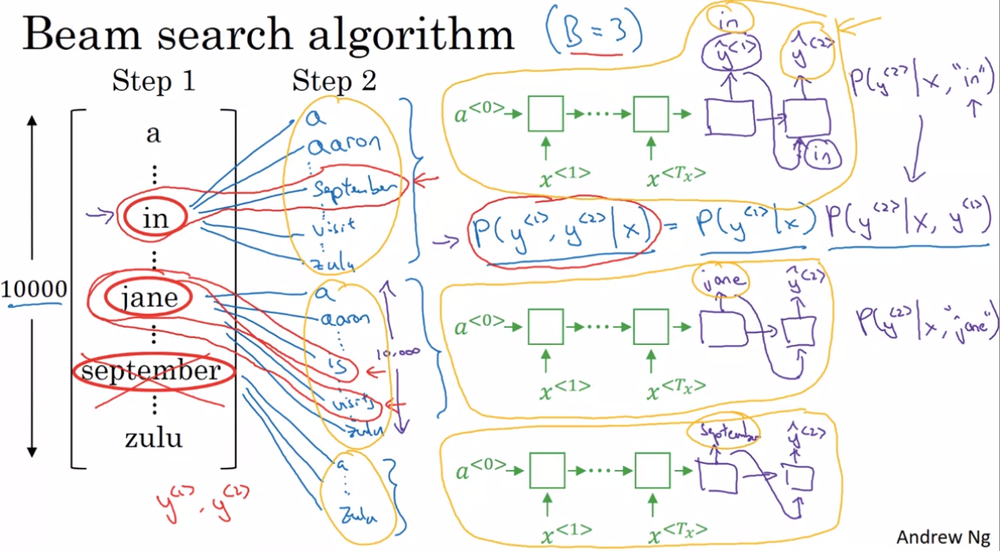

- Step 3
    - The same idea as in step 2, we now bring in the top $B$ combinations of $<y^{<1>}, y^{<2>}>$ to predict $y^{<3>}$.
    - After evaluating all $B \times N_{vocabulary}$ combinations, we again only keep the top $B$ combinations of $<y^{<1>}, y^{<2>}, y^{<3>}>$
    - This process continues until the model puts "\<EOS\>" as the last output word.
    
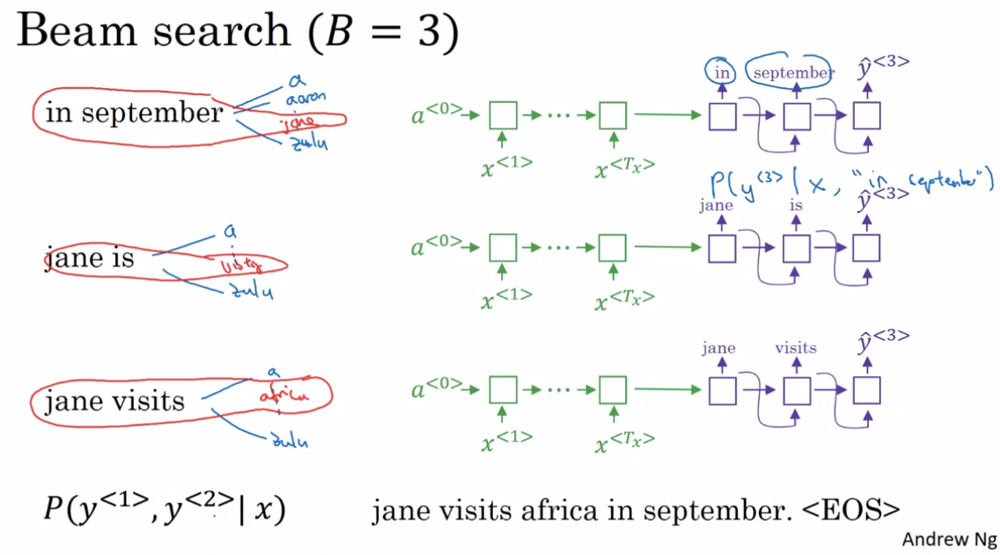    

## Refinements to Beam Search
- Length Normalization
    - From the introduction above, the goal of the Beam Search algorithm is to find an output sentence $y = argmax_{y} \prod_{t=1}^{T_{y}} P(y^{<t>} | x, y^{<1>}, ..., y^{<t-1>})$.
    - However, because usually $P(y^{<t>} | x, y^{<1>}, ..., y^{<t-1>}) \ll 1$, taking a product of them may lead to numeric underflow.
    - Thus, we usually take a $log$ of these probabilities to avoid the problem and instead find $argmax_{y} \sum_{t=1}^{T_{y}} log P(y^{<t>} | x, y^{<1>}, ..., y^{<t-1>})$
    - Another step we can also take is to average these log probabilities by the power of sentence length.
        - i.e. We find $argmax_{y} \frac{1}{T_{y}^{\alpha}} \sum_{t=1}^{T_{y}} log P(y^{<t>} | x, y^{<1>}, ..., y^{<t-1>})$
        
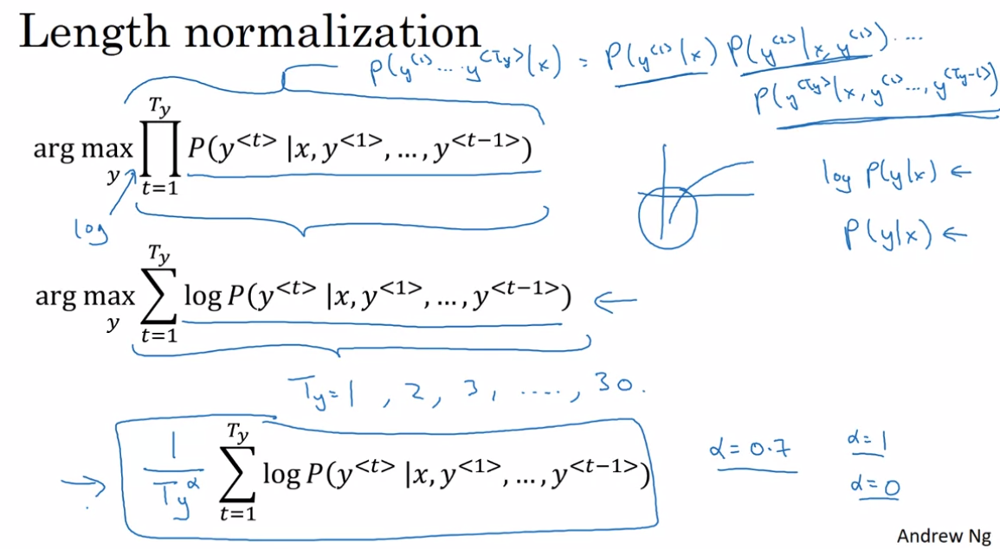

- Beam Search Discussion
    - Large $B$: better output sentence but slower
    - Small $B$: worse output sentence but faster.
    - Usually on production level, $B \approx 10$ is used.

## Error Analysis in Beam Search

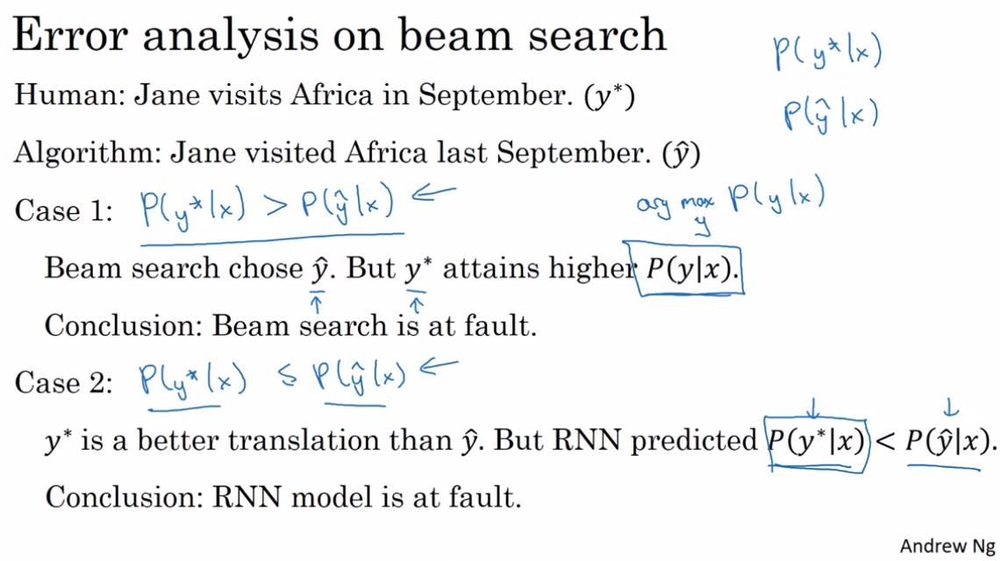

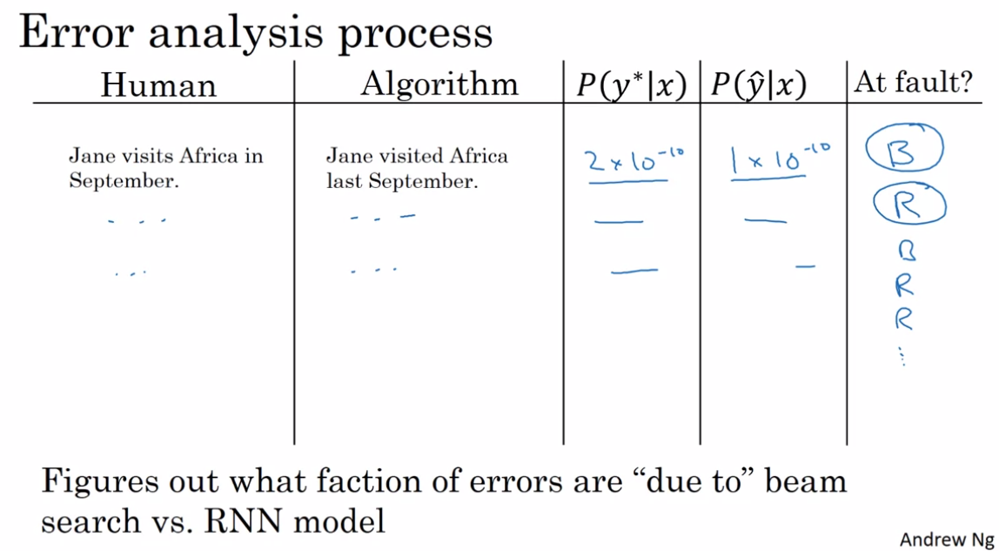

## Bleu (Bilingual Evaluation) Score
- A problem in machine translation is that there might be more than one good translation in a different language for the original sentence - how do we compare model outputs with these different versions of good translations?
- One intuition of comparing machine translation (MT) with human reference is to calculate **precision** and **modified precision**, which are based on counting whether each word in MT also appears in human reference.

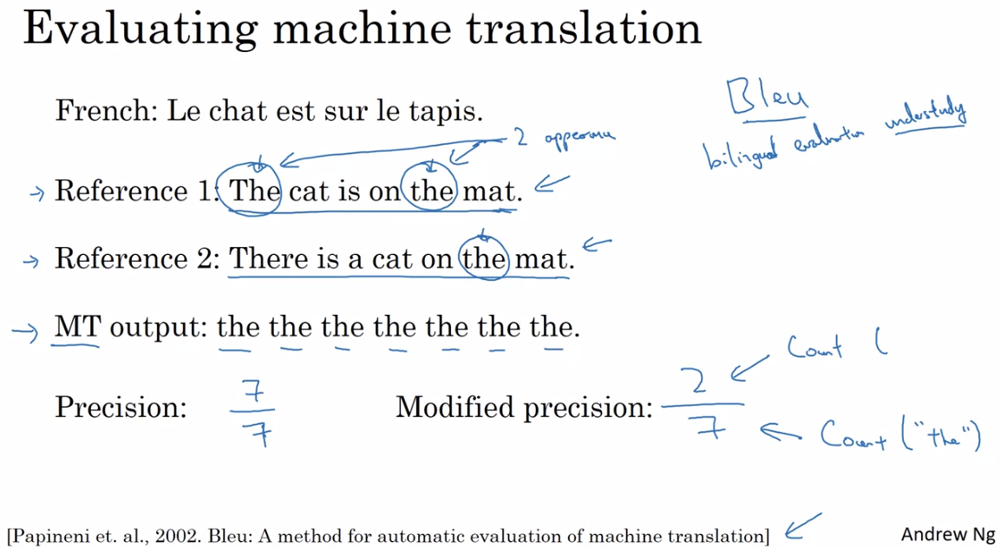

- In the case of two-word combinations (bigrams), for each bigram in the MT output, define the precision scores as follows:
    - $\text{Count} += 1$ if the bigram appears in any of the human references
    - $\text{Count}_{clip} += 1$ if the bigram appears in any of the human references, but require $\text{Count}_{clip} < \text{Total number of appearances in any one of the reference}$
    - $\text{Modified Precision} = \frac{\sum \text{Count}_{clip}}{\sum \text{Count}}$
    
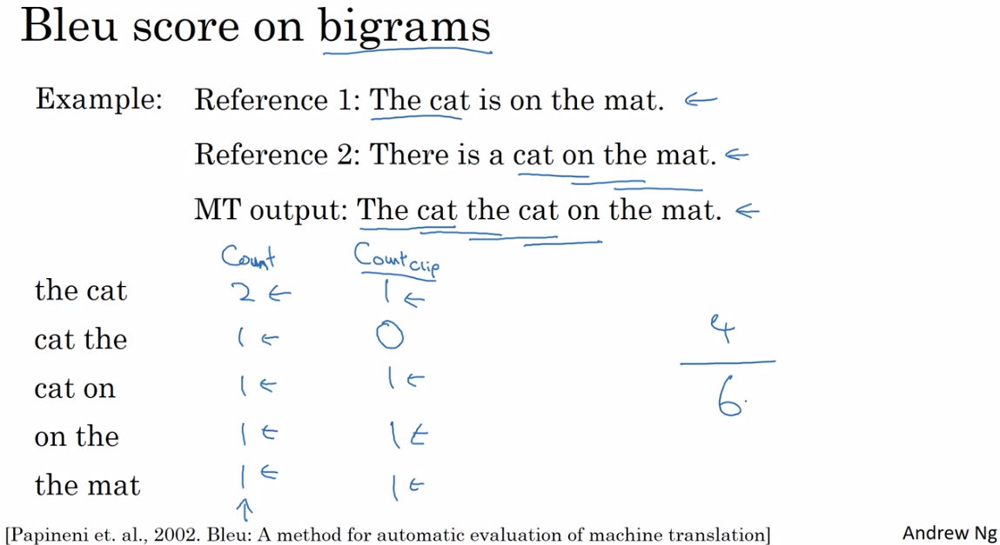

- More generally:
    - $\text{Modified Precision for n-gram} = p_{n} = \frac{\sum_{\text{n-grams} \in \hat y} \text{Count}_{clip} (\text{n-gram})}{\sum_{\text{n-grams} \in \hat y} \text{Count} (\text{n-gram})}$

- Bleu Details
    - $p_{n} = \text{Bleu score on n-grams only}$
    - $\text{Combined Bleu Score} = BP \times exp(\frac{1}{N} \sum_{n=1}^{N} p_{n})$
        - BP: Brevity Penalty, added to prevent the algorithm from always returning short translations for high precisions.

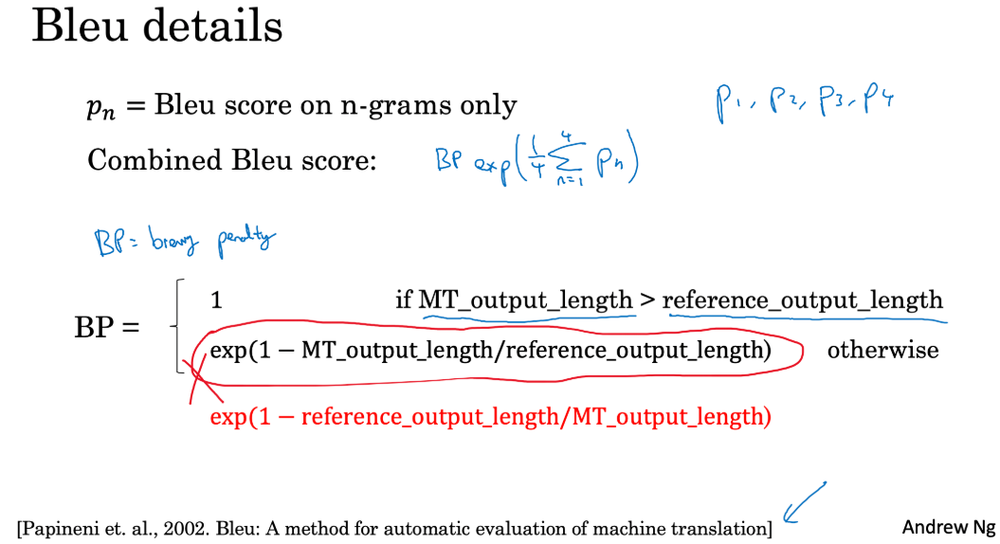

## Attention Model Intuition
- So far, we've been using a **encoder-decoder** architecture, in which the entire input sentence is fed into the RNN to generate outputs.
    - However, this architecture tends to work well only with short input sentences.
    - The attention model helps us getting bettern results from longer inputs.

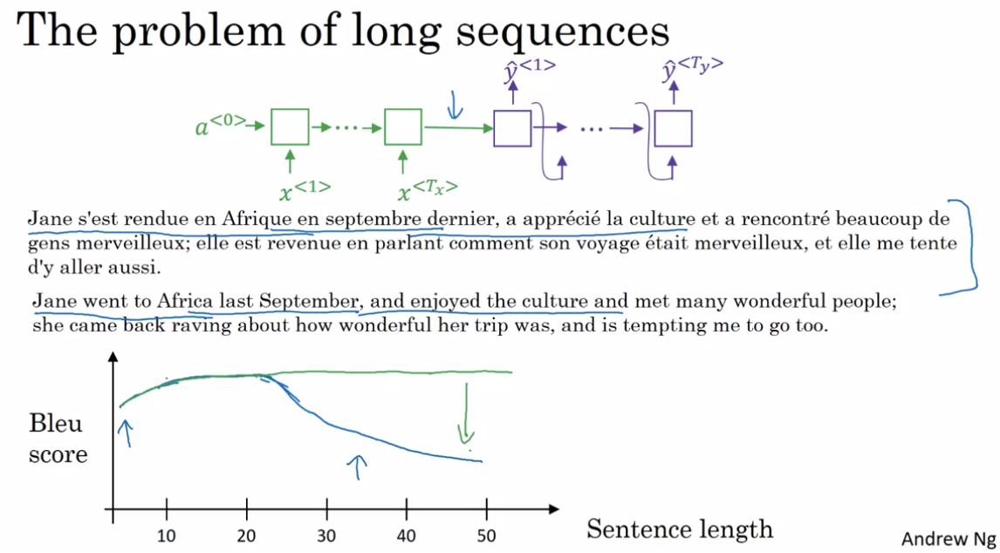

- The intuition of the attention model is that we define **attention weights** $\alpha ^{<i, j>}$ to represent how much attention do we need to put on the $j^{th}$ word in the input sentence when generating the $i^{th}$ output (e.g. translating the $i^{th}$ word).

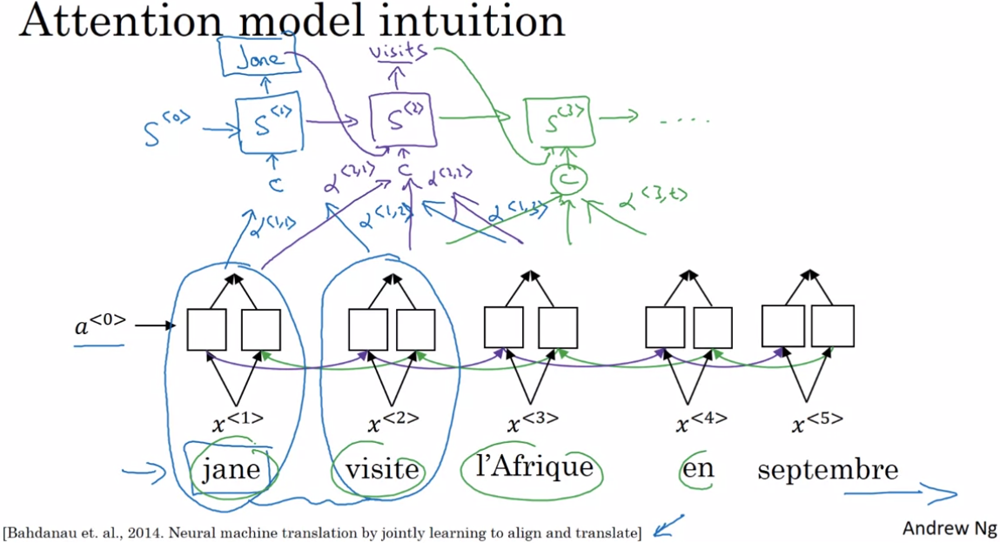

## Attention Model
- Architecture
    - As introduced from the previous section, in the attention model, we first feed the input sentence into a sequential bi-directional RNN.
        - Here, to simplify notations, let $a^{<t>} = (\overrightarrow a^{<t>}, \overleftarrow a^{<t>})$
    - Then, we define **attention weights** $\alpha^{<t, t'>} = \text{amount of "attention" } y^{<t>} \text{ should pay to } a^{<t'>}$
    - Then, define **context** $c^{<t>} = \sum_{t'} \alpha ^{<t, t'>} a^{<t'>}$
    
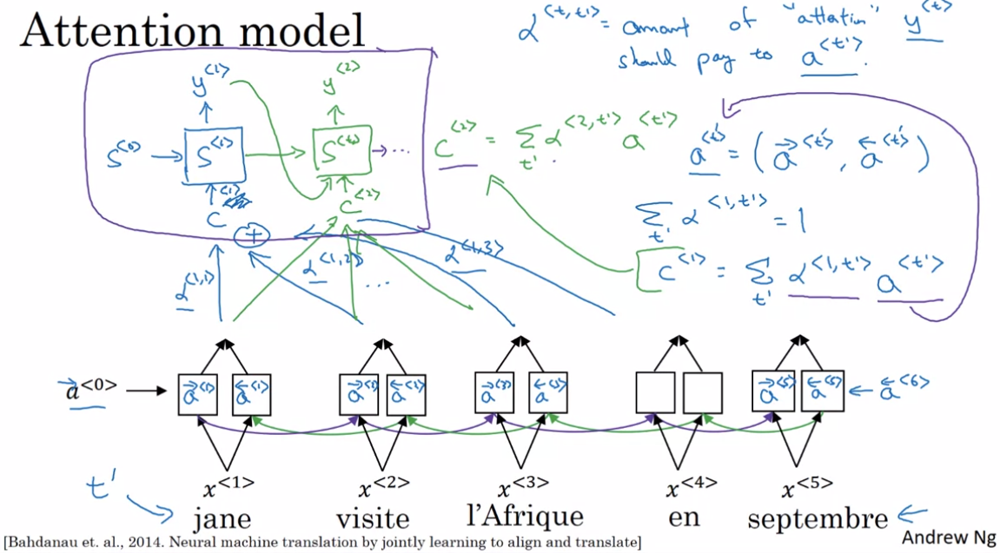

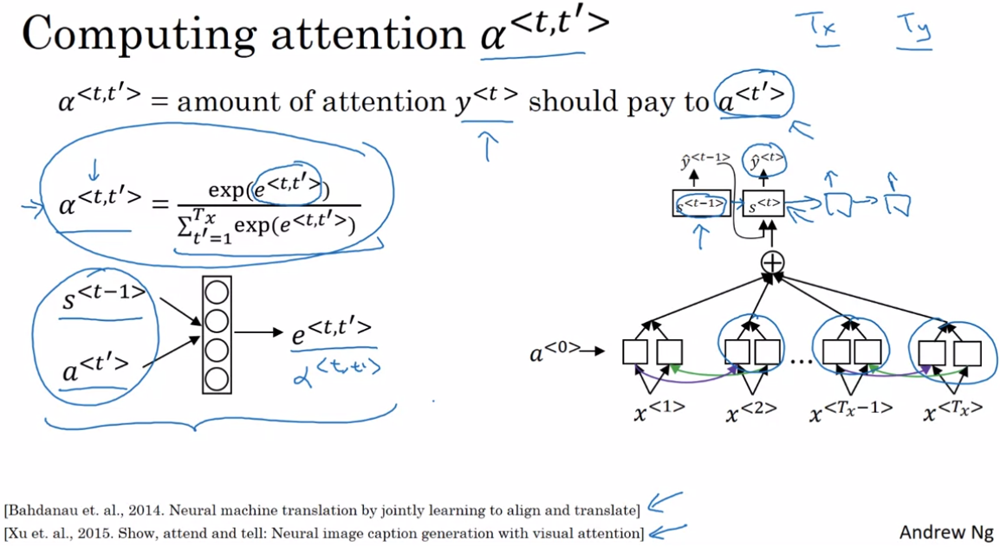

# Speech Recognition - Audio Data

## Speech Recognition

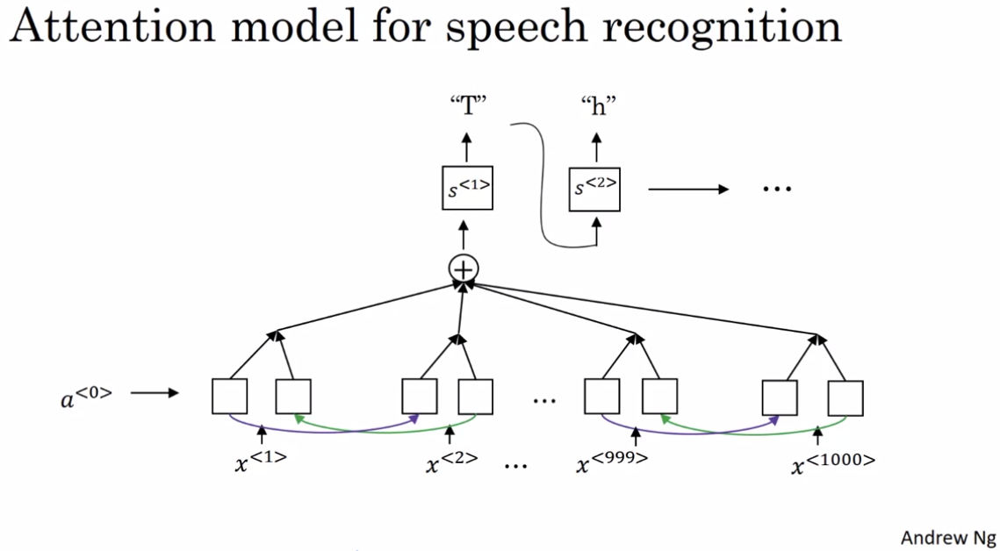

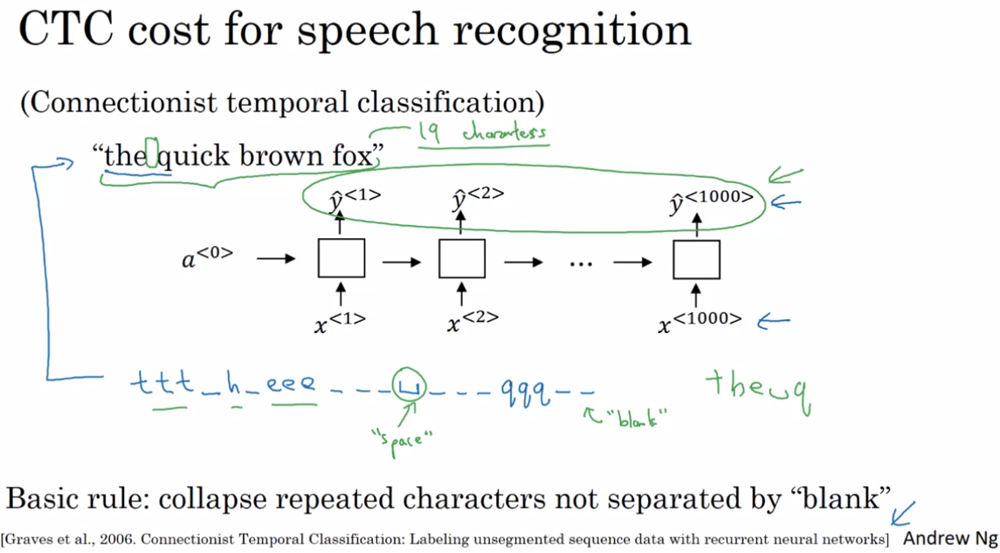

## Trigger Word Detection
- To build a trigger word detection algorithm, we feed the audio input into an RNN and label 1 when the trigger word is said, while label 0 elsewhere.
    - However, this would lead to an un-even training set, as the majority of labels will be 0s.
    - A "hack" is to label more than one outputs after the trigger word is said to be 1s, so that we have slightly more 1s in the training set.
    
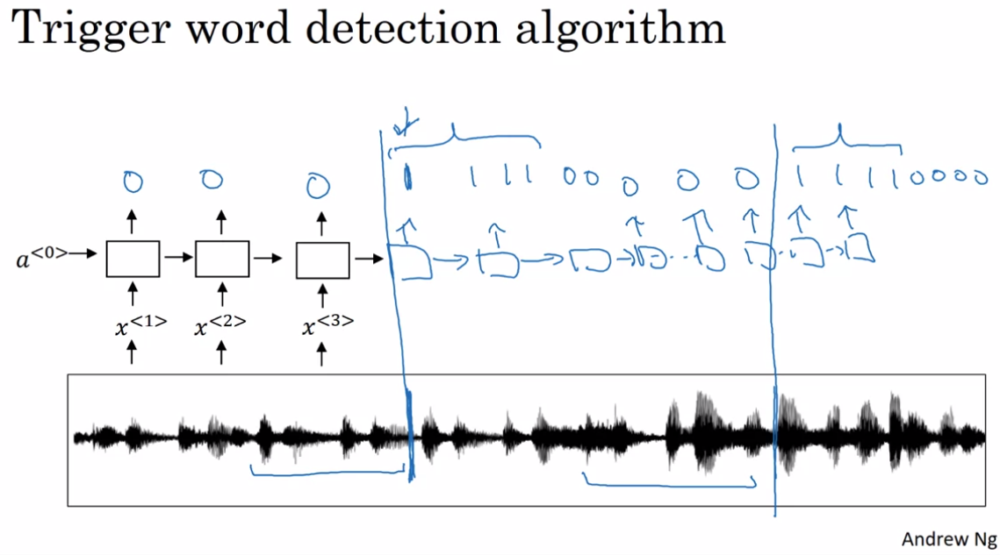